In [22]:
from DicomRTTool.ReaderWriter import DicomReaderWriter, ROIAssociationClass
import matplotlib.pyplot as plt
import numpy as np

# Set your folder path
dicom_folder = '/Users/dorsamotiallah/Desktop/Polimi Studies/second semester/Applied Statistics/Project/Data/per_studenti/3012'

In [23]:
def display_slices(image, mask, skip=1):
    """
    Displays a series of slices in z-direction that contains the segmented regions of interest.
    Ensures all contours are displayed in consistent and different colors.
        Parameters:
            image (array-like): Numpy array of image.
            mask (array-like): Numpy array of mask.
            skip (int): Only print every nth slice, i.e. if 3 only print every 3rd slice, default 1.
        Returns:
            None (series of in-line plots).
    """

    slice_locations = np.unique(np.where(mask != 0)[0]) # get indexes for where there is a contour present 
    slice_start = slice_locations[0] # first slice of contour 
    slice_end = slice_locations[len(slice_locations)-1] # last slice of contour
    
    counter = 1
    
    for img_arr, contour_arr in zip(image[slice_start:slice_end+1], mask[slice_start:slice_end+1]): # plot the slices with contours overlayed ontop
        if counter % skip == 0: # if current slice is divisible by desired skip amount 
            masked_contour_arr = np.ma.masked_where(contour_arr == 0, contour_arr)
            plt.imshow(img_arr, cmap='gray', interpolation='none')
            plt.imshow(masked_contour_arr, cmap='cool', interpolation='none', alpha=0.5, vmin = 1, vmax = np.amax(mask)) # vmax is set as total number of contours so same colors can be displayed for each slice
            plt.title(f"slice number: {counter}")
            plt.show()
        counter += 1

In [24]:

# Initialize
Dicom_reader = DicomReaderWriter()
Dicom_reader.walk_through_folders(dicom_folder)

Loading through DICOM files:   0%|                        | 0/1 [00:00<?, ?it/s]

Loading from /Users/dorsamotiallah/Desktop/Polimi Studies/second semester/Applied Statistics/Project/Data/per_studenti/3012


Loading through DICOM files: 100%|████████████████| 1/1 [00:00<00:00,  1.05it/s]

Compiling dictionaries together...
Could not associate the dose files ['/Users/dorsamotiallah/Desktop/Polimi Studies/second semester/Applied Statistics/Project/Data/per_studenti/3012/RD.3012.IMRT CL 300.dcm'] with a plan or structure.
Grouping with images /Users/dorsamotiallah/Desktop/Polimi Studies/second semester/Applied Statistics/Project/Data/per_studenti/3012 based on Frame of Reference UID
Could not associate the dose files ['/Users/dorsamotiallah/Desktop/Polimi Studies/second semester/Applied Statistics/Project/Data/per_studenti/3012/RD.3012.VMAT CLI 14.dcm'] with a plan or structure.
Grouping with images /Users/dorsamotiallah/Desktop/Polimi Studies/second semester/Applied Statistics/Project/Data/per_studenti/3012 based on Frame of Reference UID
Could not associate the dose files ['/Users/dorsamotiallah/Desktop/Polimi Studies/second semester/Applied Statistics/Project/Data/per_studenti/3012/RD.3012.VMAT CLI DMAX.dcm'] with a plan or structure.
Grouping with images /Users/dorsamo

In [25]:
all_rois = Dicom_reader.return_rois(print_rois=True)


The following ROIs were found
body
lungs
spinalcanal
heart
esophagus
ctv_high
aorta
mtv
couchsurface
couchinterior
ptv_high
polm sano
prv mid
ghost
ptv_air
ptv_solid
dose 1000[cgy]
dose 2000[cgy]
dose 3000[cgy]
dose 4000[cgy]
dose 5000[cgy]
dose 6000[cgy]
dose 500[cgy]


In [26]:
Contour_Names = ['cuore']
associations = [
    ROIAssociationClass('cuore', ['cuore','heart','Heart'])  # use actual names from print
]

# Contour_Names = ['heart']
# associations = [
#     ROIAssociationClass('heart',['heart'])  # use actual names from print
# ]


# Contour_Names = ['polmoni']
# associations = [
#     ROIAssociationClass('polmoni', ['polmoni'])  # full lung
# ]

Dicom_reader.set_contour_names_and_associations(contour_names=Contour_Names, associations=associations)


Contour names or associations changed, resetting mask


In [27]:
# Step 3: Find image series/indexes that include all required ROIs
indexes = Dicom_reader.which_indexes_have_all_rois()
print("Indexes with all ROIs:", indexes)

# Step 4: Choose one (e.g., last)
pt_index = indexes[0]
Dicom_reader.set_index(pt_index)

# Step 5: Load the CT image, mask, and dose
Dicom_reader.get_images_and_mask()


The following indexes have all ROIs present
Index 0, located at /Users/dorsamotiallah/Desktop/Polimi Studies/second semester/Applied Statistics/Project/Data/per_studenti/3012
Finished listing present indexes
Indexes with all ROIs: [0]
Loading images for None at 
 /Users/dorsamotiallah/Desktop/Polimi Studies/second semester/Applied Statistics/Project/Data/per_studenti/3012

Erasing any previous mask as we load a new new image set


In [28]:
# Step 7: Access data
image = Dicom_reader.ArrayDicom              # CT array
mask = Dicom_reader.mask           # binary mask for 'cuore'
Dicom_reader.get_dose()  # this will populate Dicom_reader.dose
dose = Dicom_reader.dose                     # dose array (aligned)
dicom_sitk_handle = Dicom_reader.dicom_handle
mask_sitk_handle = Dicom_reader.annotation_handle

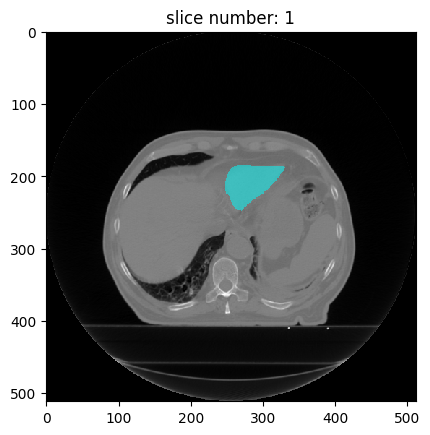

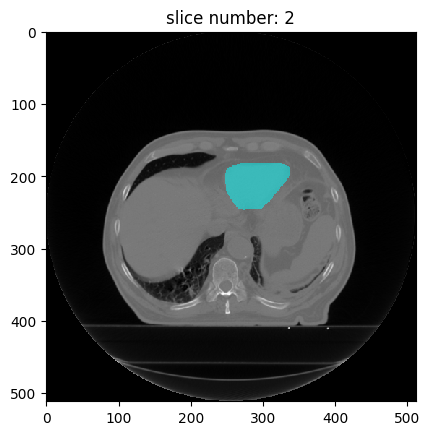

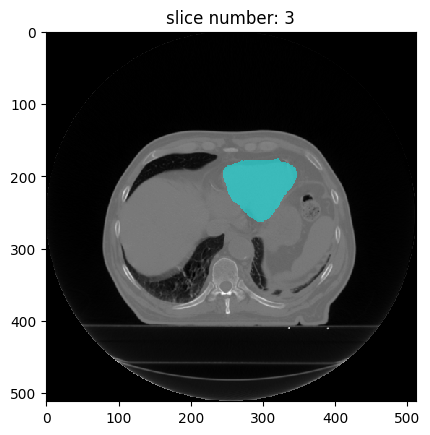

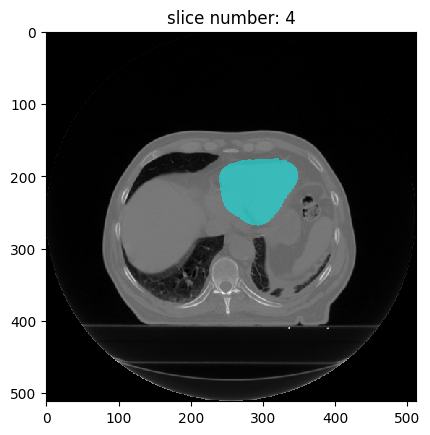

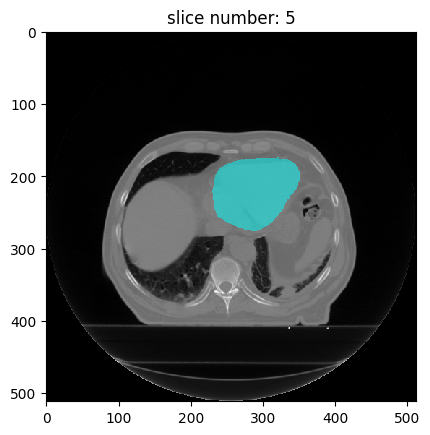

...

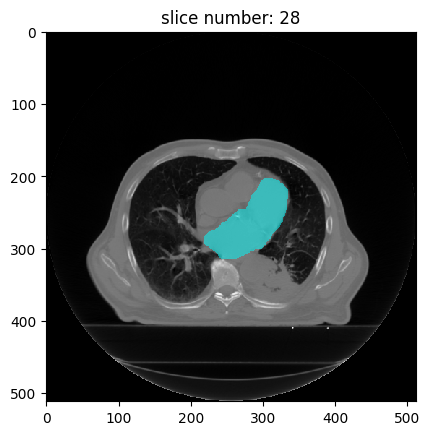

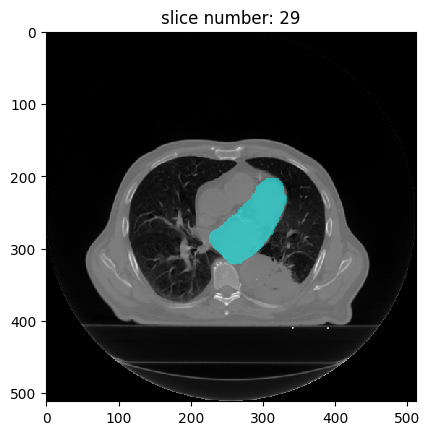

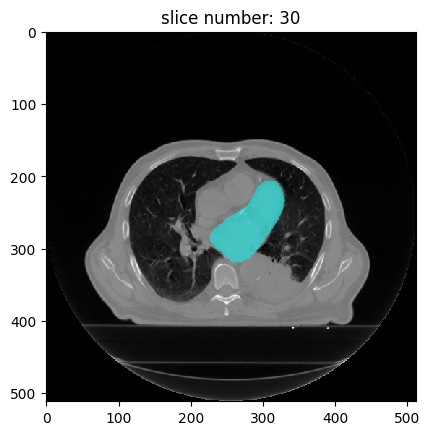

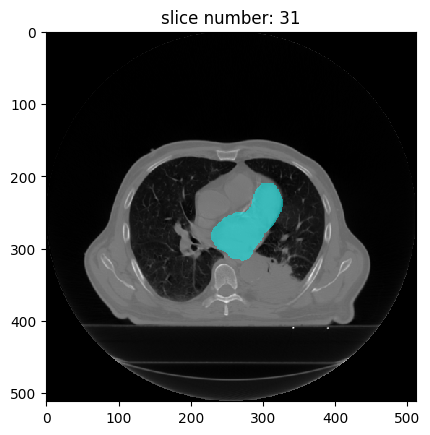

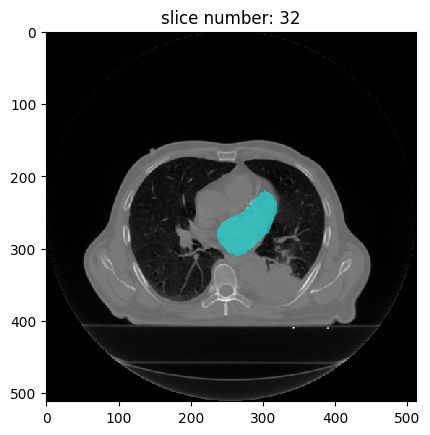

In [29]:
display_slices(image, mask, skip = 1)

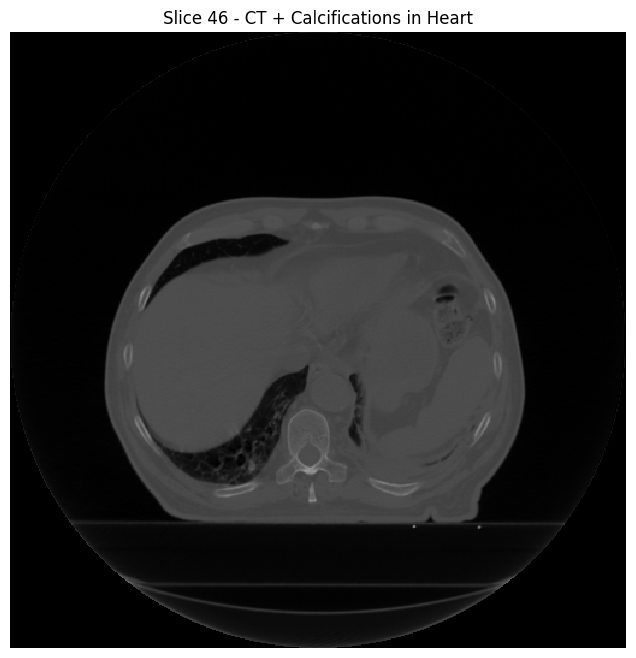

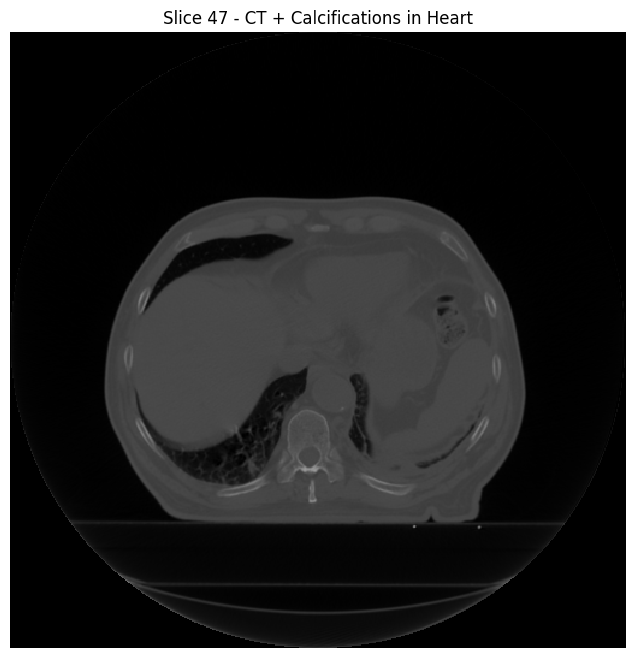

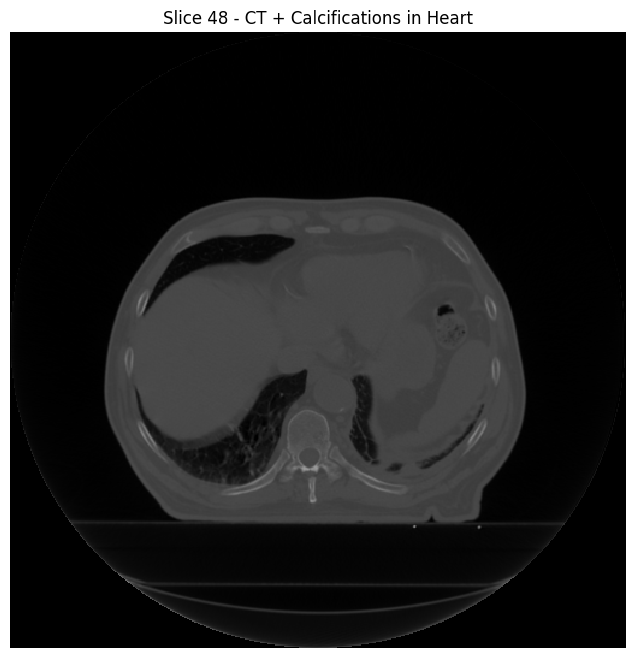

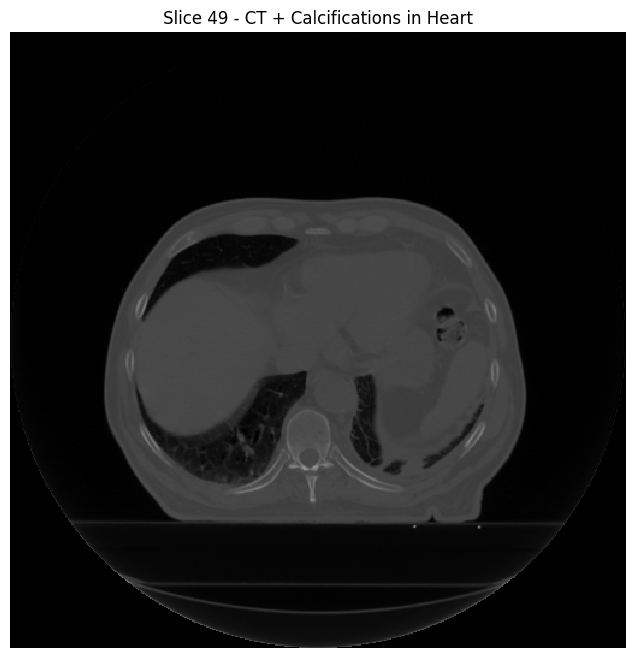

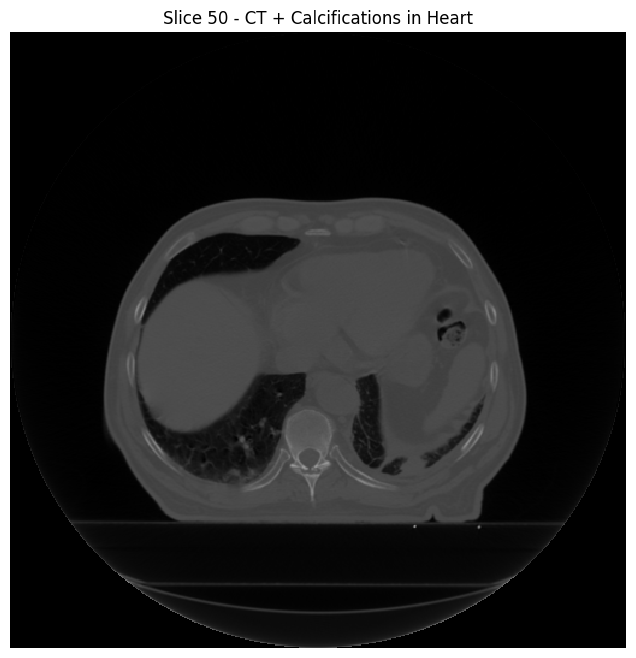

...

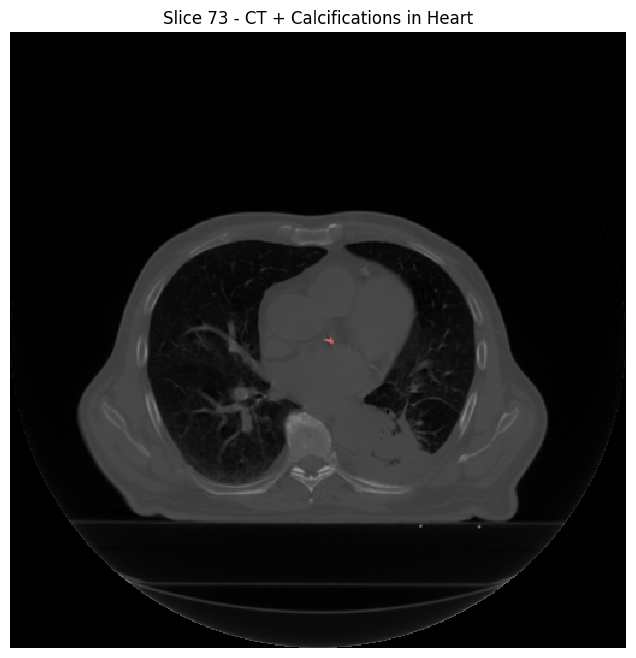

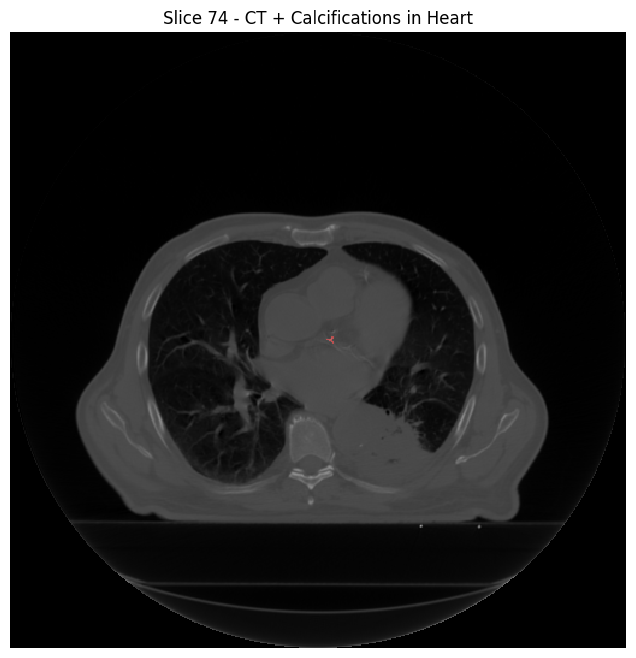

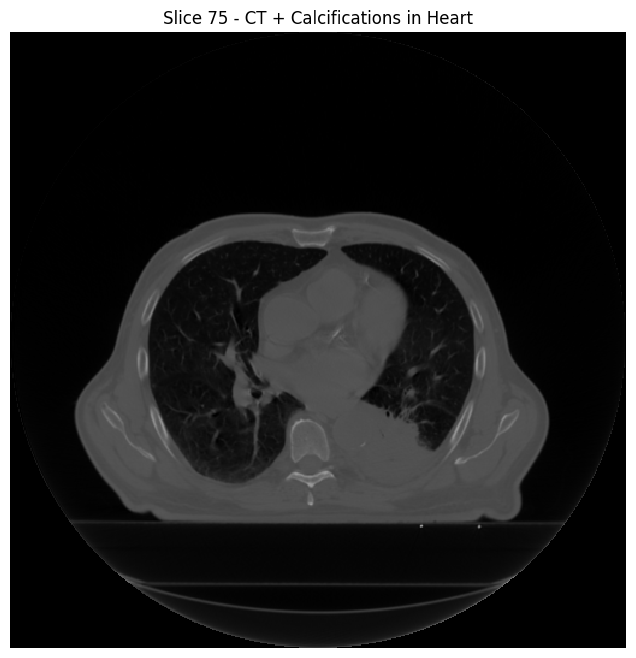

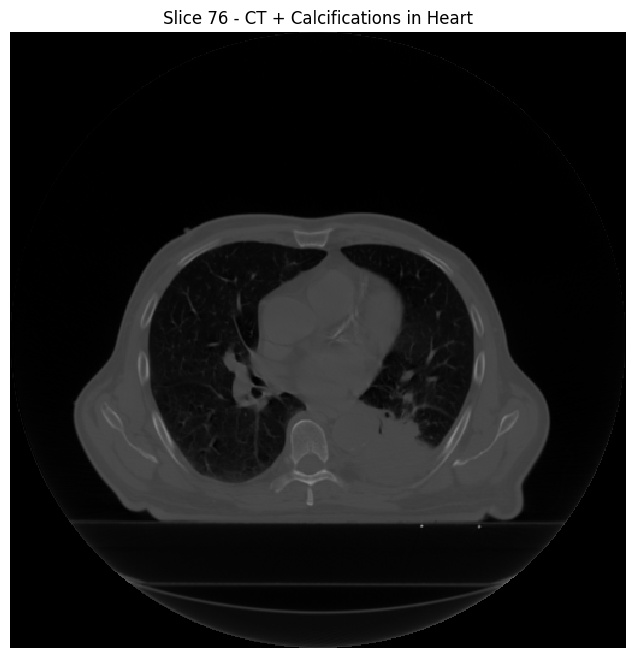

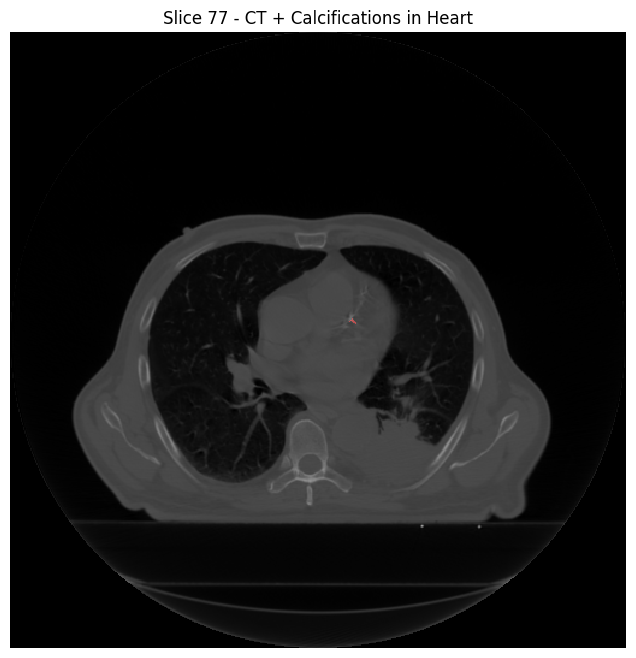

In [30]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.measure import label, regionprops
from skimage.color import label2rgb

def display_calcifications_within_heart(image, mask, skip=1):
    """
    Displays CT slices containing heart masks, with overlayed thresholded calcifications.
    
    Parameters:
        image (ndarray): 3D CT image array (z, y, x)
        mask (ndarray): 3D heart segmentation mask (z, y, x)
        skip (int): Display every nth slice
    
    Returns:
        None
    """
    slice_indices = np.unique(np.where(mask != 0)[0])
    slice_start, slice_end = slice_indices[0], slice_indices[-1]

    for idx, (img_slice, heart_mask) in enumerate(zip(image[slice_start:slice_end+1], mask[slice_start:slice_end+1]), start=slice_start):
        if (idx - slice_start) % skip != 0:
            continue
        
        # --- Threshold for calcifications ---
        calc_mask = (img_slice > 130) & (img_slice < 700)

        # --- Restrict to heart region only ---
        calc_within_heart = calc_mask & (heart_mask > 0)

        # --- Label connected components ---
        labeled = label(calc_within_heart)

        # --- Filter based on size & eccentricity ---
        for region in regionprops(labeled):
            if region.area < 10 or region.eccentricity > 0.9:
                labeled[labeled == region.label] = 0

        # --- Normalize image for overlay ---
        norm_img = (img_slice - np.min(img_slice)) / (np.max(img_slice) - np.min(img_slice) + 1e-5)

        # --- Overlay filtered labels ---
        overlay = label2rgb(labeled, image=norm_img, bg_label=0, alpha=0.4)

        # --- Display ---
        plt.figure(figsize=(8, 8))
        plt.imshow(overlay, interpolation='none')
        plt.title(f'Slice {idx} - CT + Calcifications in Heart')
        plt.axis('off')
        plt.show()


display_calcifications_within_heart(image, mask, skip=1)

In [31]:
from skimage.measure import label, regionprops

def get_calcified_lesions(image, mask, hu_threshold=(130, 700), min_area=10, max_eccentricity=0.9):
    """
    Processes a 3D CT image and heart mask to identify calcified regions within the heart.
    
    Returns a list of dictionaries per slice with lesion properties.
    """
    calcification_data = []

    slice_indices = np.unique(np.where(mask != 0)[0])
    slice_start, slice_end = slice_indices[0], slice_indices[-1]

    for idx in range(slice_start, slice_end + 1):
        img_slice = image[idx]
        heart_mask = mask[idx]

        # Threshold calcifications and restrict to heart region
        calc_mask = (img_slice > hu_threshold[0]) & (img_slice < hu_threshold[1])
        calc_within_heart = calc_mask & (heart_mask > 0)

        # Label connected components
        labeled = label(calc_within_heart)

        # Extract valid regions
        valid_regions = []
        for region in regionprops(labeled, intensity_image=img_slice):
            if region.area >= min_area and region.eccentricity <= max_eccentricity:
                valid_regions.append({
                    "slice_index": idx,
                    "label": region.label,
                    "area": region.area,
                    "max_intensity": region.max_intensity,
                    "coords": region.coords
                })

        calcification_data.append({
            "slice_index": idx,
            "regions": valid_regions,
            "labeled_mask": labeled
        })

    return calcification_data


In [32]:
import matplotlib.pyplot as plt
from skimage.color import label2rgb

def display_calcified_lesions(image, calcification_data):
    """
    Visualizes calcified regions on CT image slices using precomputed data.
    """
    for data in calcification_data:
        idx = data["slice_index"]
        labeled = data["labeled_mask"]
        img_slice = image[idx]

        # Skip slices with no regions
        if len(data["regions"]) == 0:
            continue

        norm_img = (img_slice - np.min(img_slice)) / (np.max(img_slice) - np.min(img_slice) + 1e-5)
        overlay = label2rgb(labeled, image=norm_img, bg_label=0, alpha=0.4)

        plt.figure(figsize=(8, 8))
        plt.imshow(overlay, interpolation='none')
        plt.title(f'Slice {idx} - CT + Detected Calcifications')
        plt.axis('off')
        plt.show()


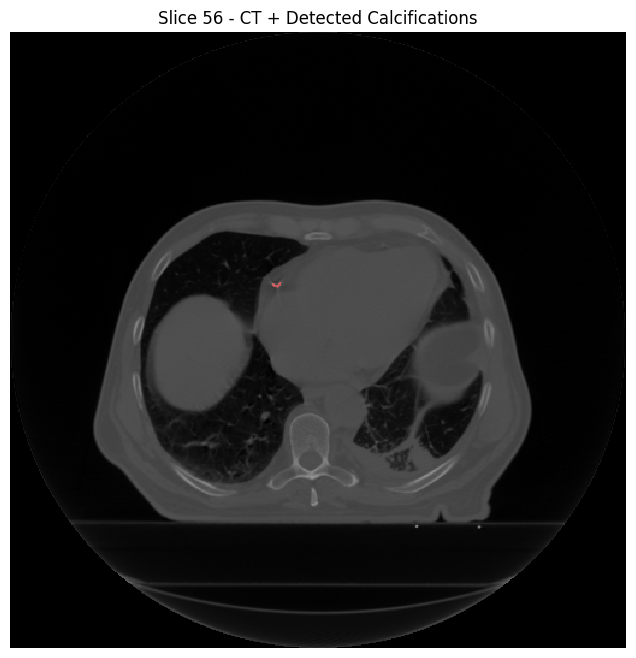

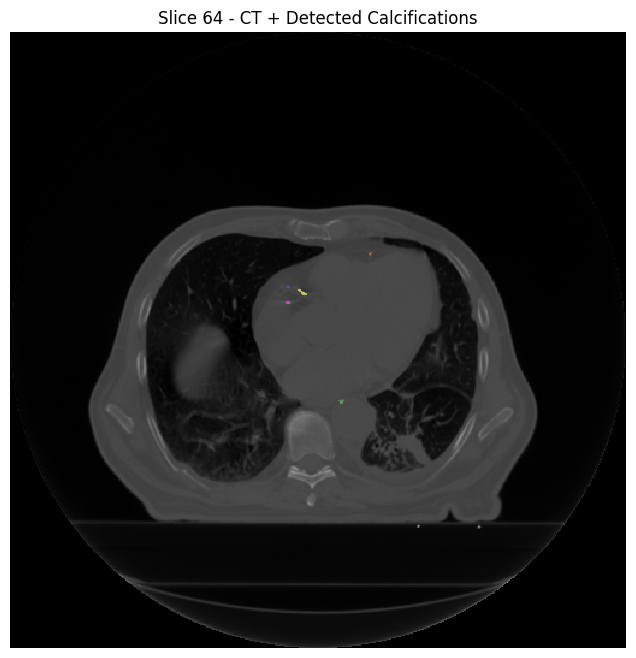

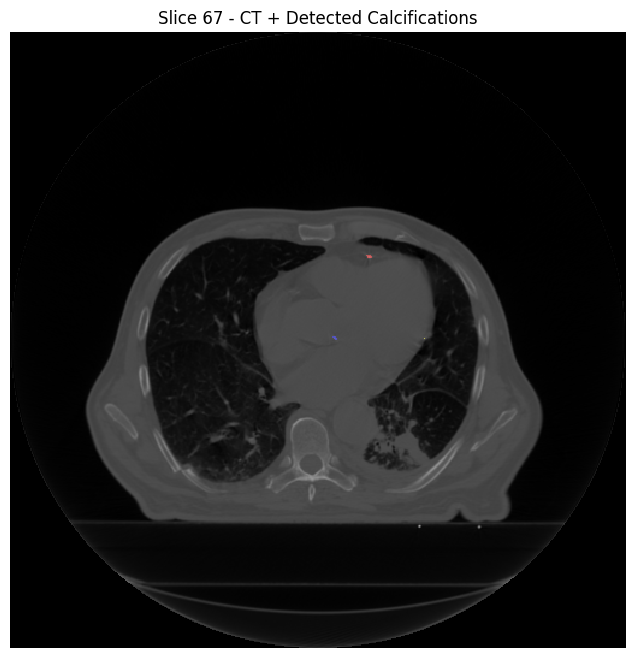

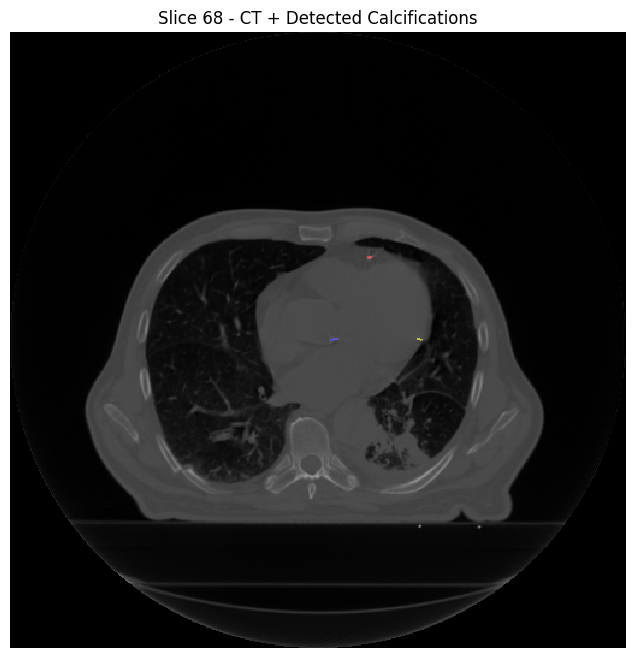

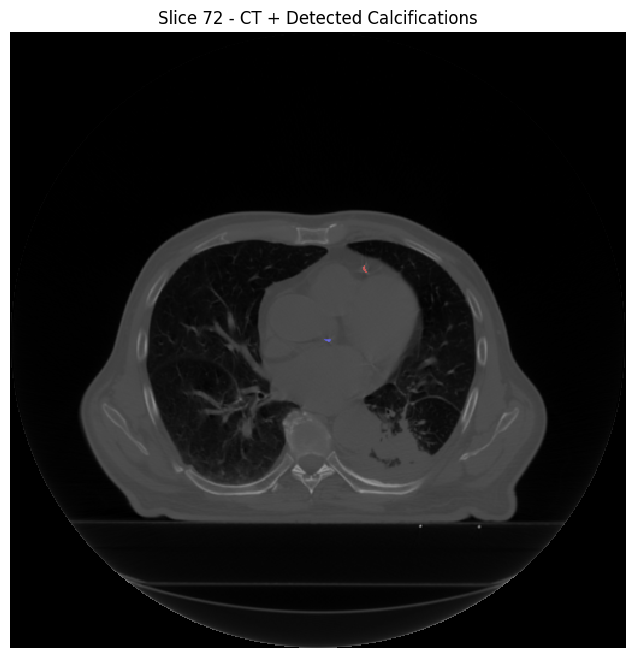

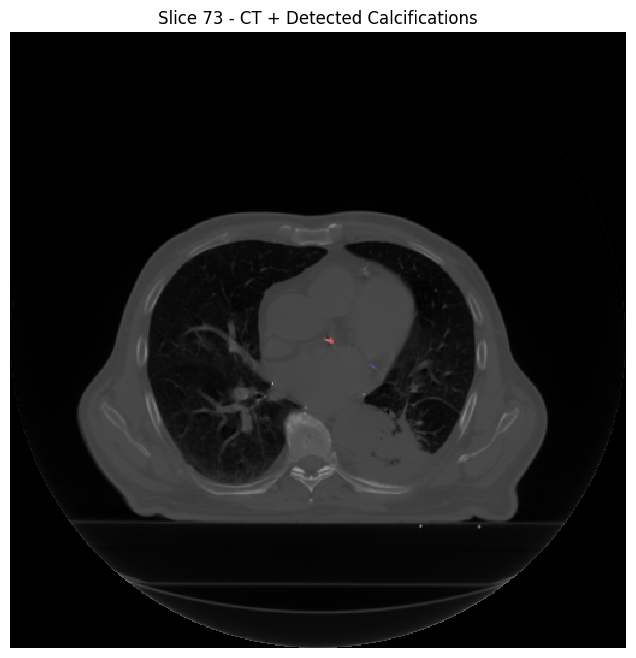

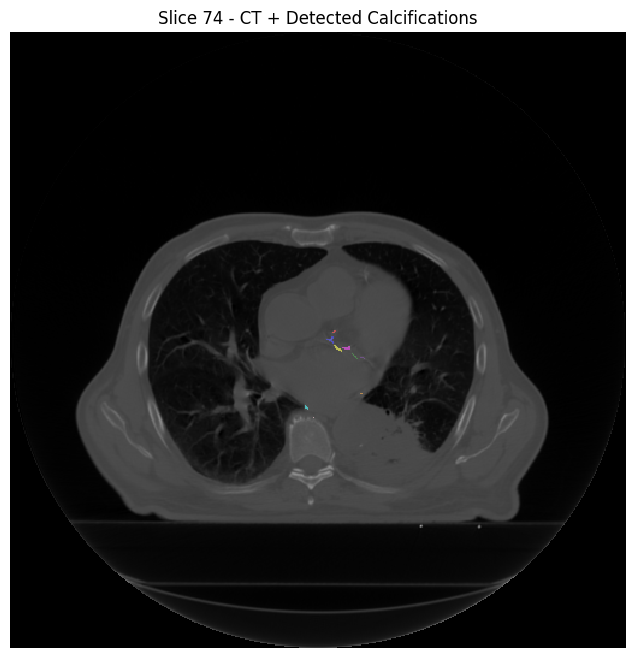

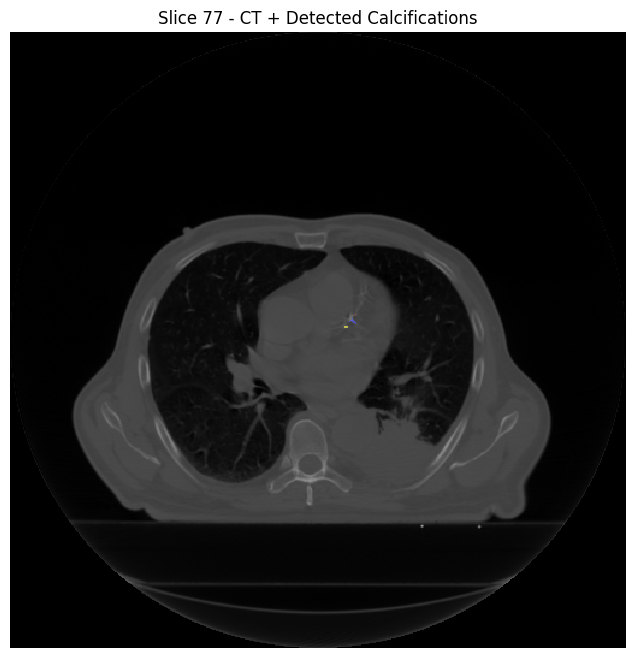

In [33]:
calcification_data = get_calcified_lesions(image, mask)
# calcification_data
display_calcified_lesions(image, calcification_data)

In [759]:
import os
import pydicom
import numpy as np

def load_dicom_series(dicom_dir):
    """
    Loads and sorts a series of DICOM CT slices from a directory.

    Parameters:
        dicom_dir (str): Path to folder containing DICOM files.

    Returns:
        slices (list of pydicom.Dataset): Sorted CT DICOM slices
        volume (ndarray): 3D NumPy volume (z, y, x)
        pixel_spacings (list of tuple): List of (row_spacing, col_spacing) per slice
        slice_thickness (float): Distance between slices in mm
    """
    slices = []

    for f in os.listdir(dicom_dir):
        if not f.lower().endswith('.dcm'):
            continue

        try:
            dcm = pydicom.dcmread(os.path.join(dicom_dir, f))
            if getattr(dcm, 'Modality', '') == 'CT' and hasattr(dcm, 'PixelData'):
                slices.append(dcm)
        except Exception as e:
            print(f"Skipping file {f}: {e}")

    if not slices:
        raise ValueError("No valid CT slices found in the folder.")

    # Sort slices by position along z-axis (ImagePositionPatient[2])
    slices.sort(key=lambda x: float(x.ImagePositionPatient[2]))

    # Convert to 3D NumPy volume
    volume = np.stack([s.pixel_array for s in slices], axis=0)

    # Extract pixel spacings
    pixel_spacings = [tuple(map(float, s.PixelSpacing)) for s in slices]

    # Calculate slice thickness (z-direction spacing)
    try:
        slice_thickness = abs(slices[1].ImagePositionPatient[2] - slices[0].ImagePositionPatient[2])
    except:
        slice_thickness = float(getattr(slices[0], 'SliceThickness', 1.0))

    return slices, volume, pixel_spacings, slice_thickness



dicom_path = '/Users/dorsamotiallah/Desktop/Polimi Studies/second semester/Applied Statistics/Project/Data/per_studenti/LM1097'
slices, ct_volume, pixel_spacings, slice_thickness = load_dicom_series(dicom_path)

print("CT volume shape:", ct_volume.shape)
print("Pixel spacing [mm]:", pixel_spacings[0])
print("Slice thickness [mm]:", slice_thickness)

consistent = all(p == pixel_spacings[0] for p in pixel_spacings)
print("Pixel spacing is consistent across slices:", consistent)

CT volume shape: (137, 512, 512)
Pixel spacing [mm]: (0.9765625, 0.9765625)
Slice thickness [mm]: 3.0
Pixel spacing is consistent across slices: True


In [760]:
def calculate_agatston_score(calcification_data, pixel_spacing, slice_thickness):
    """
    Calculates the Agatston score from identified calcified regions.
    
    Parameters:
        calcification_data (list): Output from get_calcified_lesions()
        pixel_spacing (tuple): (row_spacing_mm, col_spacing_mm) from DICOM metadata
        
    Returns:
        total_score (float): Total Agatston score
        lesion_scores (list): Detailed list of individual lesion scores
    """
    row_spacing, col_spacing = pixel_spacing
    pixel_area_mm2 = row_spacing * col_spacing

    total_score = 0
    total_volume_mm3 = 0.0
    lesion_scores = []

    for slice_data in calcification_data:
        for region in slice_data["regions"]:
            max_hu = region["max_intensity"]
            area_pixels = region["area"]
            area_mm2 = area_pixels * pixel_area_mm2
            volume_mm3 = area_mm2 * slice_thickness

            # Determine density weighting factor
            if 130 <= max_hu < 200:
                weight = 1
            elif 200 <= max_hu < 300:
                weight = 2
            elif 300 <= max_hu < 400:
                weight = 3
            elif max_hu >= 400:
                weight = 4
            else:
                weight = 0  # shouldn't happen, all lesions should be >130 HU

            score = area_mm2 * weight
            total_score += score
            total_volume_mm3 += volume_mm3

            lesion_scores.append({
                "slice_index": region["slice_index"],
                "area_mm2": area_mm2,
                "max_hu": max_hu,
                "weight": weight,
                "score": score,
                "volume_mm3": volume_mm3
            })

    return total_score, lesion_scores , total_volume_mm3


In [761]:
pixel_spacing = pixel_spacings[0]
total_score, lesion_scores , total_volume = calculate_agatston_score(calcification_data, pixel_spacing, slice_thickness)

print(f"Total Agatston Score: {total_score}")
print(f"Total Agatston Score: {total_volume}")
for lesion in lesion_scores:
    print(f"Slice {lesion['slice_index']} | Area: {lesion['area_mm2']:.2f} mm² | "
          f"Max HU: {lesion['max_hu']:.1f} | Weight: {lesion['weight']} | Score: {lesion['score']:.2f}")


Total Agatston Score: 4241.943359375
Total Agatston Score: 3561.9735717773438
Slice 32 | Area: 20.03 mm² | Max HU: 563.0 | Weight: 4 | Score: 80.11
Slice 33 | Area: 19.07 mm² | Max HU: 619.0 | Weight: 4 | Score: 76.29
Slice 34 | Area: 201.23 mm² | Max HU: 330.0 | Weight: 3 | Score: 603.68
Slice 35 | Area: 100.14 mm² | Max HU: 370.0 | Weight: 3 | Score: 300.41
Slice 36 | Area: 186.92 mm² | Max HU: 319.0 | Weight: 3 | Score: 560.76
Slice 37 | Area: 248.91 mm² | Max HU: 493.0 | Weight: 4 | Score: 995.64
Slice 40 | Area: 9.54 mm² | Max HU: 247.0 | Weight: 2 | Score: 19.07
Slice 41 | Area: 66.76 mm² | Max HU: 696.0 | Weight: 4 | Score: 267.03
Slice 42 | Area: 30.52 mm² | Max HU: 607.0 | Weight: 4 | Score: 122.07
Slice 43 | Area: 41.96 mm² | Max HU: 695.0 | Weight: 4 | Score: 167.85
Slice 44 | Area: 30.52 mm² | Max HU: 652.0 | Weight: 4 | Score: 122.07
Slice 45 | Area: 32.42 mm² | Max HU: 698.0 | Weight: 4 | Score: 129.70
Slice 46 | Area: 30.52 mm² | Max HU: 681.0 | Weight: 4 | Score: 122.07

In [445]:
print("Dose shape:", None if dose is None else dose.shape)


Dose shape: (139, 512, 512)


In [446]:
def display_slices_with_dose(image, mask, dose, skip=1, dose_alpha=0.4):
    """
    Displays slices with CT + heart mask + dose overlay.
    """
    slice_locations = np.unique(np.where(mask != 0)[0])
    slice_start = slice_locations[0]
    slice_end = slice_locations[-1]

    counter = 1

    for z in range(slice_start, slice_end + 1):
        if counter % skip == 0:
            img_arr = image[z]
            contour_arr = mask[z]
            dose_arr = dose[z]

            # Mask for ROI (cuore)
            masked_contour_arr = np.ma.masked_where(contour_arr == 0, contour_arr)

            plt.figure(figsize=(8, 8))
            plt.imshow(img_arr, cmap='gray', interpolation='none')
            plt.imshow(dose_arr, cmap='jet', interpolation='none', alpha=dose_alpha)  # Dose heatmap
            plt.imshow(masked_contour_arr, cmap='cool', interpolation='none', alpha=0.5)
            plt.title(f"Slice {z}")
            plt.axis('off')
            plt.colorbar(label="Dose (Gy)")
            plt.show()
        counter += 1


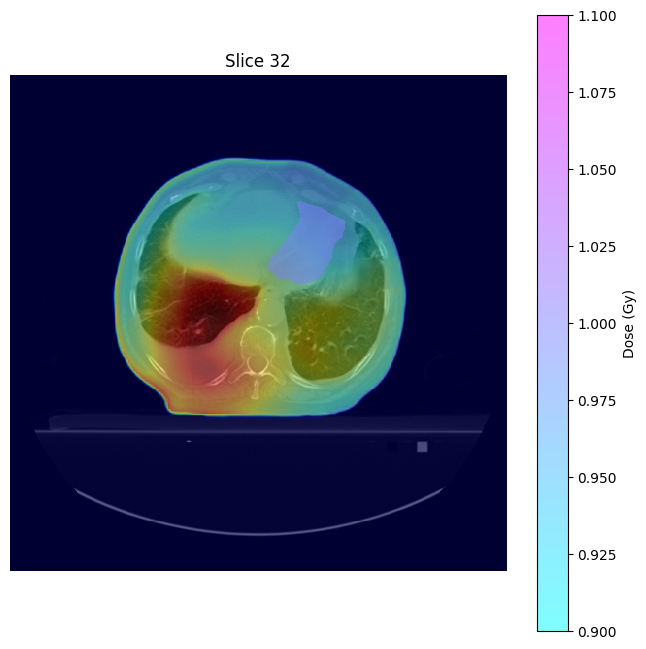

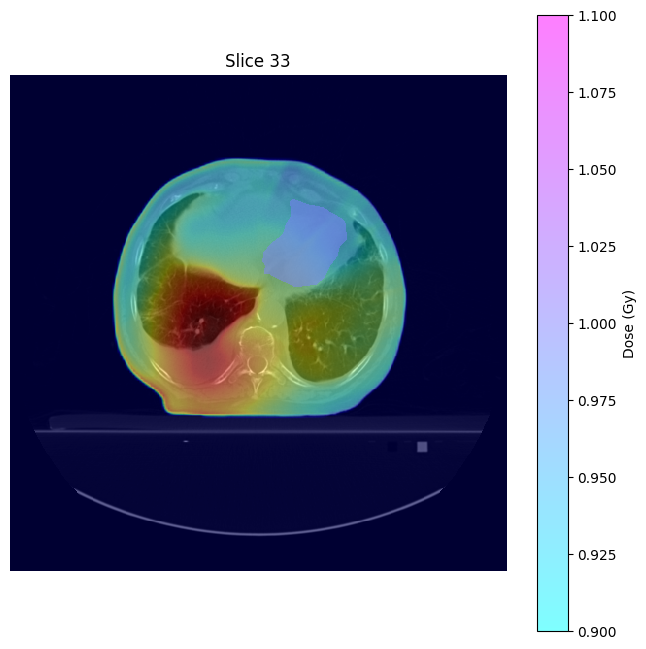

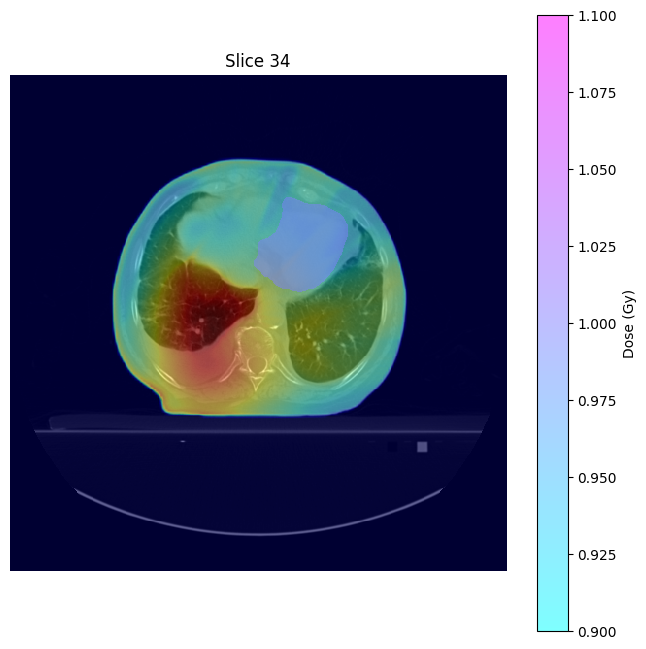

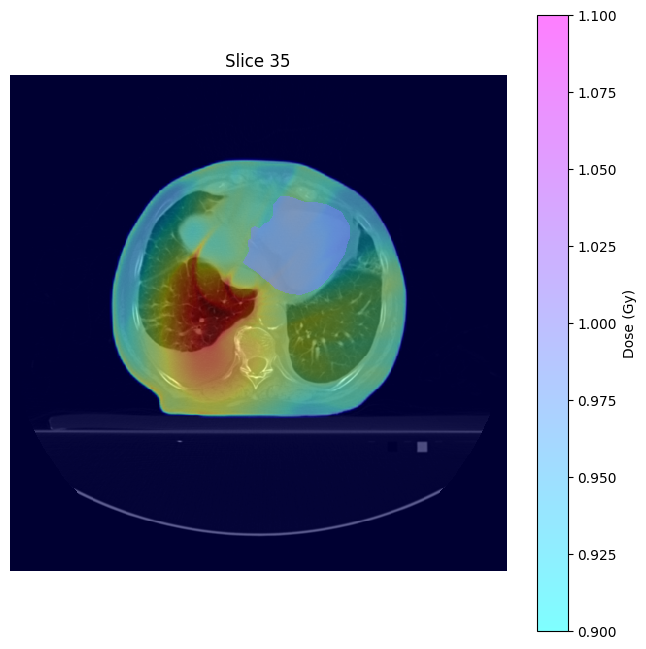

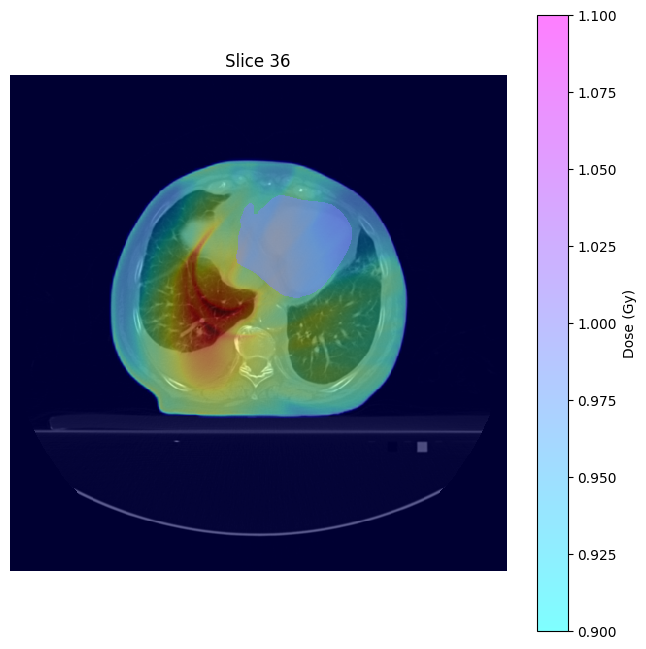

...

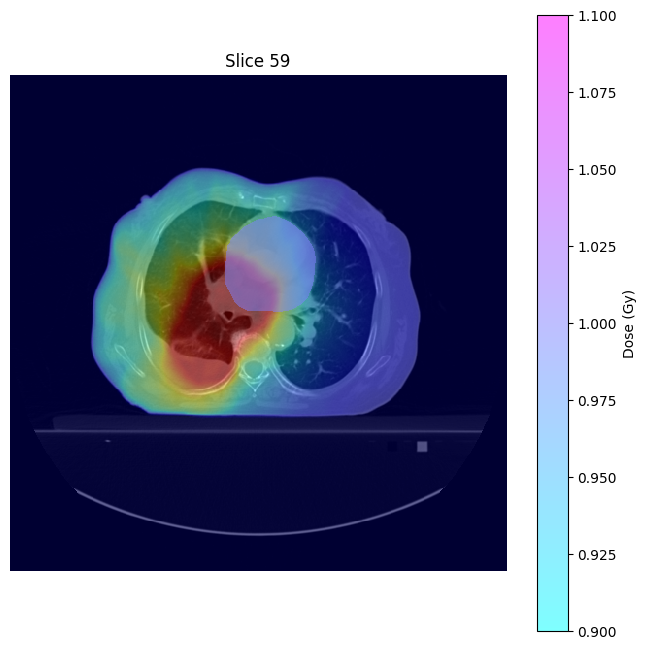

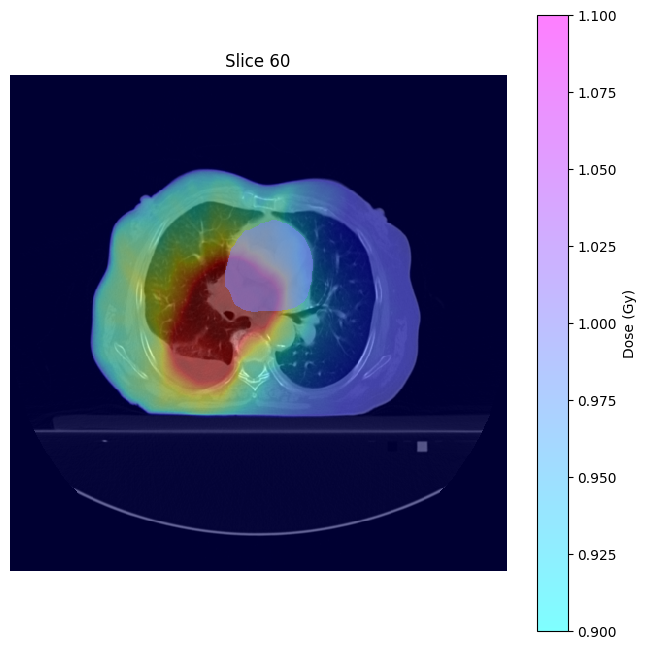

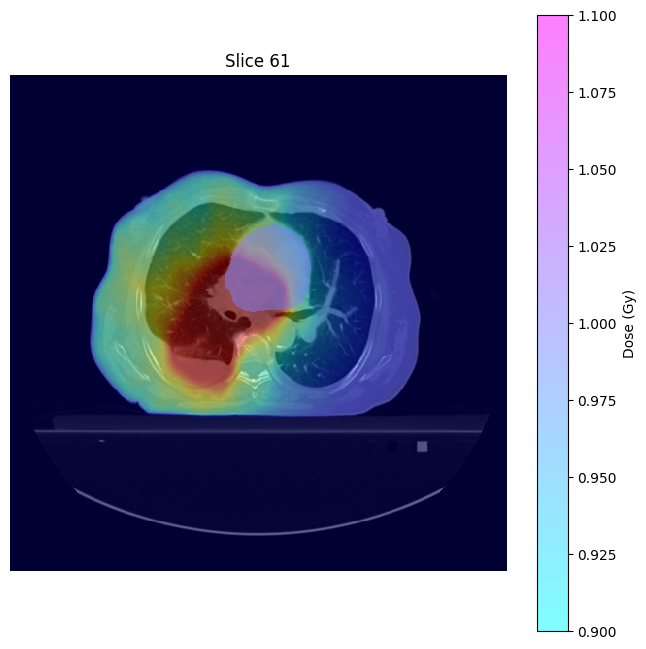

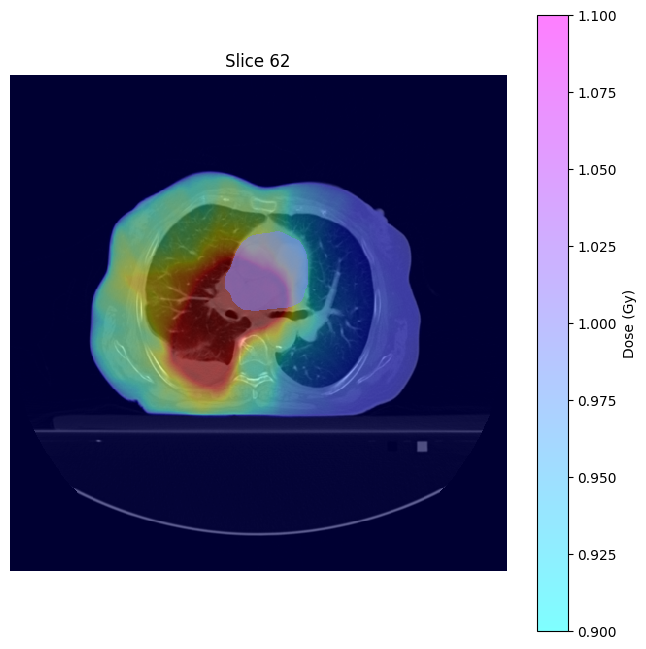

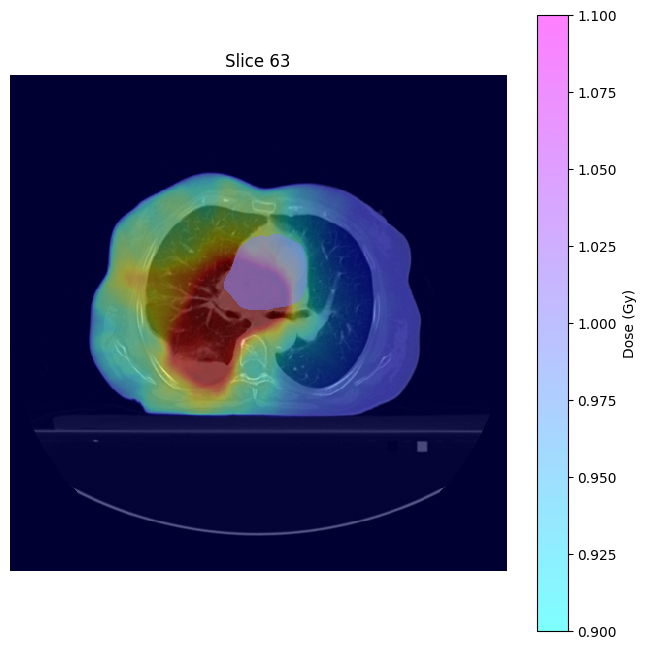

In [60]:
display_slices_with_dose(image, mask, dose, skip=1)

In [53]:
import numpy as np
import pandas as pd

# Dose array and mask already loaded and aligned
voxel_volume_mm3 = np.prod(Dicom_reader.dicom_handle.GetSpacing())  # in mm³
voxel_volume_cm3 = voxel_volume_mm3 / 1000.0                        # convert to cm³

structure_dose = dose[mask != 0]  # Dose values inside structure only
total_volume_cm3 = np.sum(mask != 0) * voxel_volume_cm3

print(total_volume_cm3)

747.0731735229492


In [68]:
import numpy as np
import pandas as pd

# Replace with your actual label and ID
structure_name = 'Heart'
patient_id = 'LM1001'

# Dose array and mask already loaded and aligned
voxel_volume_mm3 = np.prod(Dicom_reader.dicom_handle.GetSpacing())  # in mm³
voxel_volume_cm3 = voxel_volume_mm3 / 1000.0                        # convert to cm³

structure_dose = dose[mask != 0]  # Dose values inside structure only
total_volume_cm3 = np.sum(mask != 0) * voxel_volume_cm3

# Initialize table row
dvh_stats = {
    "ID": patient_id,
    "structure_name": structure_name,
    "Volume [cm3]": round(volume_cm3, 2),
    "Max_dose_plan": round(np.max(dose), 2),
    "Max_dose_str": round(np.max(structure_dose), 2),
    "Min_dose_str": round(np.min(structure_dose), 2),
    "Mean_dose_str": round(np.mean(structure_dose), 2)
}



In [69]:
dose_thresholds = np.arange(0, 71, 1)  # e.g. 0 Gy to 70 Gy

for threshold in dose_thresholds:
    voxels_above = (structure_dose >= threshold)
    volume_above = np.sum(voxels_above * mask_float[mask_float > 0]) * voxel_volume_cm3
    dvh_stats[f"{threshold} Gy"] = round(volume_above, 2)


In [67]:
dvh_df = pd.DataFrame([dvh_stats])
from IPython.display import display
display(dvh_df)


,ID,structure_name,Volume [cm3],Max_dose_plan,Max_dose_str,Min_dose_str,Mean_dose_str,0 Gy,1 Gy,2 Gy,...,61 Gy,62 Gy,63 Gy,64 Gy,65 Gy,66 Gy,67 Gy,68 Gy,69 Gy,70 Gy
0,LM1001,Heart,747.07,65.279999,63.98,2.1,20.110001,747.07,747.07,747.07,...,15.18,2.72,0.12,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [71]:
dvh_df_rounded = dvh_df.copy()
dvh_df_rounded = dvh_df_rounded.round(2)
dvh_df_rounded.to_excel(f"{structure_name}_DVH_{patient_id}.xlsx", index=False)

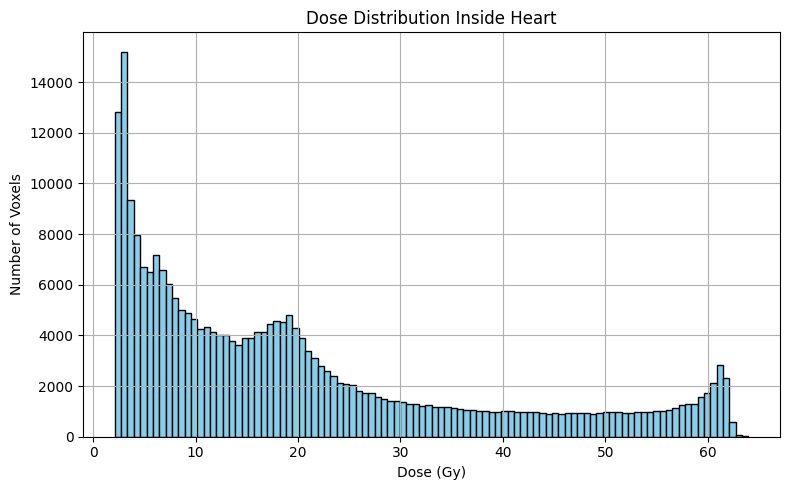

In [48]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
plt.hist(structure_dose, bins=100, color='skyblue', edgecolor='black')
plt.title("Dose Distribution Inside Heart")
plt.xlabel("Dose (Gy)")
plt.ylabel("Number of Voxels")
plt.grid(True)
plt.tight_layout()
plt.show()


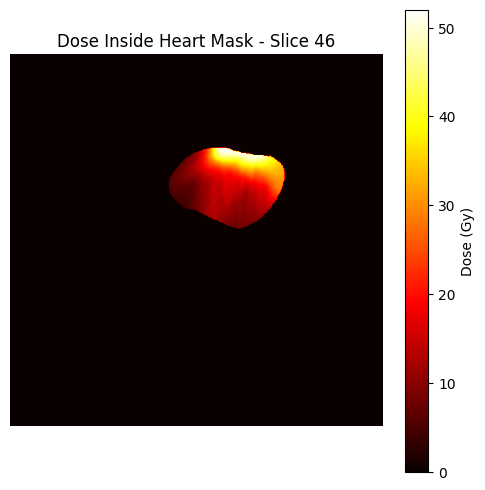

In [52]:
masked_dose = np.where(mask != 0, dose, 0)  # Set everything outside mask to 0

slice_index = 46

plt.figure(figsize=(6, 6))
plt.imshow(masked_dose[slice_index], cmap='hot', origin='upper')
plt.title(f"Dose Inside Heart Mask - Slice {slice_index}")
plt.colorbar(label="Dose (Gy)")
plt.axis('off')
plt.show()
